<a href="https://colab.research.google.com/github/escuccim/faceswap/blob/master/PyTorchFaceSwap_128b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Based on https://github.com/Oldpan/Faceswap-Deepfake-Pytorch, I have made several changes:
 - replaced the PixelShuffler with transpose convolutions because it makes more sense to do it that way.
 - replaced the sigmoids with tanhs, because I think it's a better activation function in this context.
 - implemented pytorch dataloaders to load the data; replaced the cv2 transformations with torchvision transforms where possible. This seems slower, but it may be due to the fact that we are no longer training on one batch per epoch. This also allows us to train on more data than can fit into RAM.
 - replaced the code to plot the images during training with something that is easier to understand. The old code did some weird transposes that didn't work properly when loading the data from dataloaders.
 - removed 3x3 normal conv from decoder and replaced with a transpose conv with stride 1 to attempt to smooth out artifacts.

**Issues**

 - I have some concerns about using a normal convolution at the end of the Decoding, this may be changed after I see how the results are.
 - The images seem to have more deconv-related artifacts than the original code did, resulting in more pixelated and less smooth output. This may need to be addressed after we see how the results are after training.

**Updates**

 - Replacing the last conv in the decoder with a transpose conv with stride 1 made the decoded images much better, but the swapped images were of significantly worse quality. I removed this and replaced the old conv, changing it to 3x3 from 5x5.
 - The original model was too big, I am reducing the size because there isn't really enough data to train such a large model.

In [0]:
!nvidia-smi

Wed Jan  8 17:07:50 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.44       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

In [2]:
import torch
import torchvision
from torch.utils.data import DataLoader
from matplotlib import pyplot as plt, colors
%matplotlib inline
import zipfile
import os
import matplotlib.animation as animation
import torchvision.utils as vutils
import numpy as np
import random
import shutil
import pandas as pd
import torch.nn.functional as F
from torch.autograd import Variable
from torch.utils.data import Dataset
from torch.optim import RMSprop,Adam,SGD
from torch.optim.lr_scheduler import ExponentialLR,MultiStepLR
import progressbar
from torchvision.utils import make_grid
from torchvision import models
from scipy.io import loadmat
from google.colab import auth
import PIL
import torch.utils.data
from torch import nn, optim
import torch.backends.cudnn as cudnn
import numpy
import torch.utils.data
from torch.nn import functional as F
import math
from torch.nn.parameter import Parameter
from torch.nn.functional import pad
import cv2
from torch.nn.modules import Module
from torch.nn.modules.utils import _single, _pair, _triple

from google.colab.patches import cv2_imshow
auth.authenticate_user()

# upload checkpoint to GCS
project_id = 'mammography-198911'
bucket_name = 'gan-faces'

!gcloud config set project {project_id}

Updated property [core/project].


To take a quick anonymous survey, run:
  $ gcloud survey



In [3]:
# download the model checkpoint
!mkdir checkpoint
!gsutil cp gs://{bucket_name}/autoencoder128b.pt ./checkpoint/autoencoder128b.pt

Copying gs://gan-faces/autoencoder128b.pt...
\ [1 files][  1.6 GiB/  1.6 GiB]   82.1 MiB/s                                   
Operation completed over 1 objects/1.6 GiB.                                      


In [4]:
if not os.path.exists("data/female"):
    !mkdir data
    !mkdir data/female
    !mkdir data/male

# if not os.path.exists("celeba_by_age.zip"):  
#   !gsutil cp gs://{bucket_name}/celeba_by_age.zip ./celeba_by_age.zip
#   zip_ref = zipfile.ZipFile('celeba_by_age.zip', 'r')
#   zip_ref.extractall('data_celeb_age')
#   zip_ref.close()

if not os.path.exists("celeba_by_gender.zip"):  
  !gsutil cp gs://{bucket_name}/celeba_by_gender.zip ./celeba_by_gender.zip
  zip_ref = zipfile.ZipFile('celeba_by_gender.zip', 'r')
  zip_ref.extractall('data_celeb')
  zip_ref.close()
  !mv data_celeb/celeba/female/ data/female/
  !mv data_celeb/celeba/male/ data/male/

if not os.path.exists("named_celebs_good_by_gender.zip"):  
  !gsutil cp gs://{bucket_name}/named_celebs_good_by_gender.zip ./named_celebs_good_by_gender.zip
  zip_ref = zipfile.ZipFile('named_celebs_good_by_gender.zip', 'r')
  zip_ref.extractall('data')
  zip_ref.close()
  !mv data/named_celebs_good_by_gender/female/* data/female/
  !mv data/named_celebs_good_by_gender/male/* data/male/

Copying gs://gan-faces/celeba_by_gender.zip...
\ [1 files][  1.3 GiB/  1.3 GiB]   24.0 MiB/s                                   
Operation completed over 1 objects/1.3 GiB.                                      
Copying gs://gan-faces/named_celebs_good_by_gender.zip...
- [1 files][ 76.1 MiB/ 76.1 MiB]                                                
Operation completed over 1 objects/76.1 MiB.                                     


In [0]:
random_transform_args = {
    'rotation_range': 10,
    'zoom_range': 0.05,
    'shift_range': 0.05,
    'random_flip': 0.4,
}


def get_training_data(images, batch_size):
    indices = numpy.random.randint(len(images), size=batch_size)
    for i, index in enumerate(indices):
        image = images[index]
        image = random_transform(image, **random_transform_args)
        warped_img, target_img = random_warp(image)

        if i == 0:
            warped_images = numpy.empty((batch_size,) + warped_img.shape, warped_img.dtype)
            target_images = numpy.empty((batch_size,) + target_img.shape, warped_img.dtype)

        warped_images[i] = warped_img
        target_images[i] = target_img

    return warped_images, target_images

def get_image_paths(directory):
    return [x.path for x in os.scandir(directory) if x.name.endswith(".jpg") or x.name.endswith(".png")
            or x.name.endswith(".JPG")]


def load_images(image_paths, convert=None):
    iter_all_images = (cv2.resize(cv2.imread(fn), (256, 256)) for fn in image_paths)
    if convert:
        iter_all_images = (convert(img) for img in iter_all_images)
    for i, image in enumerate(iter_all_images):
        if i == 0:
            all_images = numpy.empty((len(image_paths),) + image.shape, dtype=image.dtype)
        all_images[i] = image

# # License (Modified BSD) # Copyright (C) 2011, the scikit-image team All rights reserved. # # Redistribution and
# use in source and binary forms, with or without modification, are permitted provided that the following conditions
# are met: # # Redistributions of source code must retain the above copyright notice, this list of conditions and the
#  following disclaimer. # Redistributions in binary form must reproduce the above copyright notice, this list of
# conditions and the following disclaimer in the documentation and/or other materials provided with the distribution.
#  Neither the name of skimage nor the names of its contributors may be used to endorse or promote products derived
# from this software without specific prior written permission. # THIS SOFTWARE IS PROVIDED BY THE AUTHOR ``AS IS''
# AND ANY EXPRESS OR IMPLIED WARRANTIES, INCLUDING, BUT NOT LIMITED TO, THE IMPLIED WARRANTIES OF MERCHANTABILITY AND
#  FITNESS FOR A PARTICULAR PURPOSE ARE DISCLAIMED. IN NO EVENT SHALL THE AUTHOR BE LIABLE FOR ANY DIRECT, INDIRECT,
# INCIDENTAL, SPECIAL, EXEMPLARY, OR CONSEQUENTIAL DAMAGES (INCLUDING, BUT NOT LIMITED TO, PROCUREMENT OF SUBSTITUTE
# GOODS OR SERVICES; LOSS OF USE, DATA, OR PROFITS; OR BUSINESS INTERRUPTION) HOWEVER CAUSED AND ON ANY THEORY OF
# LIABILITY, WHETHER IN CONTRACT, STRICT LIABILITY, OR TORT (INCLUDING NEGLIGENCE OR OTHERWISE) ARISING IN ANY WAY
# OUT OF THE USE OF THIS SOFTWARE, EVEN IF ADVISED OF THE POSSIBILITY OF SUCH DAMAGE.

# umeyama function from scikit-image/skimage/transform/_geometric.py

import numpy as np


def umeyama(src, dst, estimate_scale):
    """Estimate N-D similarity transformation with or without scaling.
    Parameters
    ----------
    src : (M, N) array
        Source coordinates.
    dst : (M, N) array
        Destination coordinates.
    estimate_scale : bool
        Whether to estimate scaling factor.
    Returns
    -------
    T : (N + 1, N + 1)
        The homogeneous similarity transformation matrix. The matrix contains
        NaN values only if the problem is not well-conditioned.
    References
    ----------
    .. [1] "Least-squares estimation of transformation parameters between two
            point patterns", Shinji Umeyama, PAMI 1991, DOI: 10.1109/34.88573
    """

    num = src.shape[0]
    dim = src.shape[1]

    # Compute mean of src and dst.
    src_mean = src.mean(axis=0)
    dst_mean = dst.mean(axis=0)

    # Subtract mean from src and dst.
    src_demean = src - src_mean
    dst_demean = dst - dst_mean

    # Eq. (38).
    A = np.dot(dst_demean.T, src_demean) / num

    # Eq. (39).
    d = np.ones((dim,), dtype=np.double)
    if np.linalg.det(A) < 0:
        d[dim - 1] = -1

    T = np.eye(dim + 1, dtype=np.double)

    U, S, V = np.linalg.svd(A)

    # Eq. (40) and (43).
    rank = np.linalg.matrix_rank(A)
    if rank == 0:
        return np.nan * T
    elif rank == dim - 1:
        if np.linalg.det(U) * np.linalg.det(V) > 0:
            T[:dim, :dim] = np.dot(U, V)
        else:
            s = d[dim - 1]
            d[dim - 1] = -1
            T[:dim, :dim] = np.dot(U, np.dot(np.diag(d), V))
            d[dim - 1] = s
    else:
        T[:dim, :dim] = np.dot(U, np.dot(np.diag(d), V.T))

    if estimate_scale:
        # Eq. (41) and (42).
        scale = 1.0 / src_demean.var(axis=0).sum() * np.dot(S, d)
    else:
        scale = 1.0

    T[:dim, dim] = dst_mean - scale * np.dot(T[:dim, :dim], src_mean.T)
    T[:dim, :dim] *= scale

    return T

random_transform_args = {
    'rotation_range': 10,
    'zoom_range': 0.05,
    'shift_range': 0.05,
    'random_flip': 0.5,
}


def random_transform(image, rotation_range, zoom_range, shift_range, random_flip):
    h, w = image.shape[0:2]
    rotation = numpy.random.uniform(-rotation_range, rotation_range)
    scale = numpy.random.uniform(1 - zoom_range, 1 + zoom_range)
    tx = numpy.random.uniform(-shift_range, shift_range) * w
    ty = numpy.random.uniform(-shift_range, shift_range) * h
    mat = cv2.getRotationMatrix2D((w // 2, h // 2), rotation, scale)
    mat[:, 2] += (tx, ty)
    result = cv2.warpAffine(image, mat, (w, h), borderMode=cv2.BORDER_REPLICATE)
    if numpy.random.random() < random_flip:
        result = result[:, ::-1]
    return result


# get pair of random warped images from aligened face image
def random_warp(image):
    assert image.shape == (256, 256, 3)
    image = random_transform(image, **random_transform_args)
    range_ = numpy.linspace(128 - 100, 128 + 100, 10)
    mapx = numpy.broadcast_to(range_, (10,10))
    mapy = mapx.T

    mapx = mapx + numpy.random.normal(size=(10,10), scale=2)
    mapy = mapy + numpy.random.normal(size=(10,10), scale=2)

    interp_mapx = cv2.resize(mapx, (160,160))[16:-16, 16:-16].astype('float32')
    interp_mapy = cv2.resize(mapy, (160,160))[16:-16, 16:-16].astype('float32')

    warped_image = cv2.remap(image, interp_mapx, interp_mapy, cv2.INTER_LINEAR)

    src_points = numpy.stack([mapx.ravel(), mapy.ravel()], axis=-1)
    dst_points = numpy.mgrid[0:160:16, 0:160:16].T.reshape(-1, 2)
    mat = umeyama(src_points, dst_points, True)[0:2]

    target_image = cv2.warpAffine(image, mat, (128,128))

    return warped_image, target_image    

random_transform_args = {
    'rotation_range': 10,
    'zoom_range': 0.05,
    'shift_range': 0.05,
    'random_flip': 0.4,
}


def get_training_data(images, batch_size):
    indices = numpy.random.randint(len(images), size=batch_size)
    for i, index in enumerate(indices):
        image = images[index]
        image = random_transform(image, **random_transform_args)
        warped_img, target_img = random_warp(image)

        if i == 0:
            warped_images = numpy.empty((batch_size,) + warped_img.shape, warped_img.dtype)
            target_images = numpy.empty((batch_size,) + target_img.shape, warped_img.dtype)

        warped_images[i] = warped_img
        target_images[i] = target_img

    return warped_images, target_images

def get_image_paths(directory):
    return [x.path for x in os.scandir(directory) if x.name.endswith(".jpg") or x.name.endswith(".png")
            or x.name.endswith(".JPG")]


def load_images(image_paths, convert=None):
    iter_all_images = (cv2.resize(cv2.imread(fn), (256, 256)) for fn in image_paths)
    if convert:
        iter_all_images = (convert(img) for img in iter_all_images)
    for i, image in enumerate(iter_all_images):
        if i == 0:
            all_images = numpy.empty((len(image_paths),) + image.shape, dtype=image.dtype)
        all_images[i] = image
    return all_images

In [6]:
image_size = (256,256)
data_path_gender = "data/"
batch_size = 32

transformations = torchvision.transforms.Compose([
    # [torchvision.transforms.RandomHorizontalFlip(p=0.5), 
    #  torchvision.transforms.RandomRotation((-15,15), resample=False, expand=False),
     torchvision.transforms.RandomResizedCrop(image_size, scale=(0.80, 1.05)),
    ])

transform_normalize = torchvision.transforms.Compose([
      torchvision.transforms.ToTensor(),
      # torchvision.transforms.Normalize((0.0, 0.0, 0.0), (1.0, 1.0, 1.0))
    ])

warp_transform = torchvision.transforms.Lambda(lambda x: random_warp(x))

class SkewedImageFolder(torchvision.datasets.ImageFolder):
  def __getitem__(self, index):
        """
        Args:
            index (int): Index
        Returns:
            tuple: (sample, target) where target is class_index of the target class.
        """
        path, target = self.samples[index]
        # load the sample
        sample = self.loader(path)

        # apply the transformations
        if self.transform is not None:
            sample = self.transform(sample)
        
        # apply the random warping
        sample, target = warp_transform(np.array(sample))

        # normalize
        sample = transform_normalize(sample)
        target = transform_normalize(target)

        return sample, target

train_dataset_male = SkewedImageFolder(
        root=data_path_gender + "male",
        transform=transformations
    )

train_loader_male = torch.utils.data.DataLoader(
    train_dataset_male,
    batch_size=batch_size,
    num_workers=2,
    shuffle=True
)        


train_dataset_female = SkewedImageFolder(
        root=data_path_gender + "female",
        transform=transformations
    )

train_loader_female = torch.utils.data.DataLoader(
    train_dataset_female,
    batch_size=batch_size,
    num_workers=2,
    shuffle=True
)        

train_dataset_A = SkewedImageFolder(
        root=data_path_gender + "female/Angelina_Jolie",
        transform=transformations
    )

train_loader_A = torch.utils.data.DataLoader(
    train_dataset_A,
    batch_size=batch_size,
    num_workers=2,
    shuffle=True
)        

train_dataset_B = SkewedImageFolder(
        root=data_path_gender + "male/Brad_Pitt",
        transform=transformations
    )

train_loader_B = torch.utils.data.DataLoader(
    train_dataset_B,
    batch_size=batch_size,
    num_workers=2,
    shuffle=True
)        

print(train_dataset_male)
print(train_dataset_female)        

Dataset SkewedImageFolder
    Number of datapoints: 86796
    Root location: data/male
    StandardTransform
Transform: Compose(
               RandomResizedCrop(size=(256, 256), scale=(0.8, 1.05), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
           )
Dataset SkewedImageFolder
    Number of datapoints: 120898
    Root location: data/female
    StandardTransform
Transform: Compose(
               RandomResizedCrop(size=(256, 256), scale=(0.8, 1.05), ratio=(0.75, 1.3333), interpolation=PIL.Image.BILINEAR)
           )


inputs torch.Size([32, 3, 128, 128])
labels torch.Size([32, 3, 128, 128])


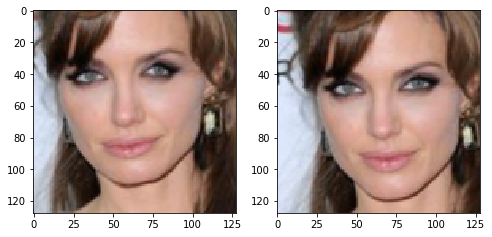

inputs torch.Size([32, 3, 128, 128])
labels torch.Size([32, 3, 128, 128])


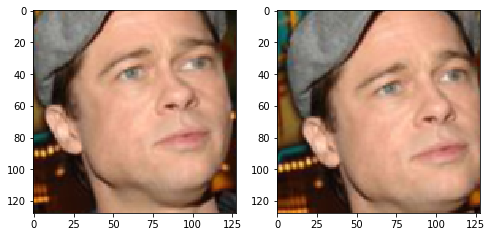

In [7]:
for (inputs, labels) in train_loader_A:
    print("inputs", inputs.shape)
    print("labels", labels.shape)
    # inputs = (inputs * 0.5) + 0.5
    # labels = (labels * 0.5) + 0.5
    fig, ax = plt.subplots(1, 2, figsize=(8,6))
    ax[0].imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    ax[1].imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()

    break

for (inputs, labels) in train_loader_B:
    print("inputs", inputs.shape)
    print("labels", labels.shape)
    # inputs = (inputs * 0.5) + 0.5
    # labels = (labels * 0.5) + 0.5
    fig, ax = plt.subplots(1, 2, figsize=(8,6))
    ax[0].imshow(np.transpose(inputs[0].detach().cpu(), (1,2,0)))
    ax[1].imshow(np.transpose(labels[0].detach().cpu(), (1,2,0)))
    plt.show()
    break    

In [0]:
class _ConvNd(Module):

    def __init__(self, in_channels, out_channels, kernel_size, stride,
                 padding, dilation, transposed, output_padding, groups, bias):
        super(_ConvNd, self).__init__()
        if in_channels % groups != 0:
            raise ValueError('in_channels must be divisible by groups')
        if out_channels % groups != 0:
            raise ValueError('out_channels must be divisible by groups')
        self.in_channels = in_channels
        self.out_channels = out_channels
        self.kernel_size = kernel_size
        self.stride = stride
        self.padding = padding
        self.dilation = dilation
        self.transposed = transposed
        self.output_padding = output_padding
        self.groups = groups
        if transposed:
            self.weight = Parameter(torch.Tensor(
                in_channels, out_channels // groups, *kernel_size))
        else:
            self.weight = Parameter(torch.Tensor(
                out_channels, in_channels // groups, *kernel_size))
        if bias:
            self.bias = Parameter(torch.Tensor(out_channels))
        else:
            self.register_parameter('bias', None)
        self.reset_parameters()

    def reset_parameters(self):
        n = self.in_channels
        for k in self.kernel_size:
            n *= k
        stdv = 1. / math.sqrt(n)
        self.weight.data.uniform_(-stdv, stdv)
        if self.bias is not None:
            self.bias.data.uniform_(-stdv, stdv)

    def __repr__(self):
        s = ('{name}({in_channels}, {out_channels}, kernel_size={kernel_size}'
             ', stride={stride}')
        if self.padding != (0,) * len(self.padding):
            s += ', padding={padding}'
        if self.dilation != (1,) * len(self.dilation):
            s += ', dilation={dilation}'
        if self.output_padding != (0,) * len(self.output_padding):
            s += ', output_padding={output_padding}'
        if self.groups != 1:
            s += ', groups={groups}'
        if self.bias is None:
            s += ', bias=False'
        s += ')'
        return s.format(name=self.__class__.__name__, **self.__dict__)


class Conv2d(_ConvNd):

    def __init__(self, in_channels, out_channels, kernel_size, stride=1,
                 padding=0, dilation=1, groups=1, bias=True):
        kernel_size = _pair(kernel_size)
        stride = _pair(stride)
        padding = _pair(padding)
        dilation = _pair(dilation)
        super(Conv2d, self).__init__(
            in_channels, out_channels, kernel_size, stride, padding, dilation,
            False, _pair(0), groups, bias)

    def forward(self, input):
        return conv2d_same_padding(input, self.weight, self.bias, self.stride,
                        self.padding, self.dilation, self.groups)


# custom con2d, because pytorch don't have "padding='same'" option.
def conv2d_same_padding(input, weight, bias=None, stride=1, padding=1, dilation=1, groups=1):

    input_rows = input.size(2)
    filter_rows = weight.size(2)
    effective_filter_size_rows = (filter_rows - 1) * dilation[0] + 1
    out_rows = (input_rows + stride[0] - 1) // stride[0]
    padding_needed = max(0, (out_rows - 1) * stride[0] + effective_filter_size_rows -
                  input_rows)
    padding_rows = max(0, (out_rows - 1) * stride[0] +
                        (filter_rows - 1) * dilation[0] + 1 - input_rows)
    rows_odd = (padding_rows % 2 != 0)
    padding_cols = max(0, (out_rows - 1) * stride[0] +
                        (filter_rows - 1) * dilation[0] + 1 - input_rows)
    cols_odd = (padding_rows % 2 != 0)

    if rows_odd or cols_odd:
        input = pad(input, [0, int(cols_odd), 0, int(rows_odd)])

    return F.conv2d(input, weight, bias, stride,
                  padding=(padding_rows // 2, padding_cols // 2),
                  dilation=dilation, groups=groups)

In [0]:
def toTensor(img):
    img = torch.from_numpy(img.transpose((0, 3, 1, 2)))
    return img


def var_to_np(img_var):
    return img_var.data.cpu().numpy()


class _ConvLayer(nn.Sequential):
    def __init__(self, input_features, output_features):
        super(_ConvLayer, self).__init__()
        self.add_module('conv2', Conv2d(input_features, output_features,
                                        kernel_size=3, stride=1))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=True))
        self.add_module('conv2_1', Conv2d(output_features, output_features,
                                        kernel_size=3, stride=2))
        self.add_module('leakyrelu_1', nn.LeakyReLU(0.1, inplace=True))

class _UpScale(nn.Sequential):
    def __init__(self, input_features, output_features, padding=1):
        super(_UpScale, self).__init__()
        self.add_module('conv2_', nn.ConvTranspose2d( input_features, output_features, 4, 2, padding, bias=True))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=True))

class _UpScalePS(nn.Sequential):
    def __init__(self, input_features, output_features):
        super(_UpScalePS, self).__init__()
        self.add_module('conv2_', Conv2d(input_features, output_features * 4,
                                         kernel_size=3))
        self.add_module('leakyrelu', nn.LeakyReLU(0.1, inplace=True))
        self.add_module('pixelshuffler', _PixelShuffler())

class Flatten(nn.Module):

    def forward(self, input):
        output = input.view(input.size(0), -1)
        return output


class Reshape(nn.Module):

    def forward(self, input):
        output = input.view(-1, 1024, 4, 4)  # channel * 4 * 4

        return output


class _PixelShuffler(nn.Module):
    def forward(self, input):
        batch_size, c, h, w = input.size()
        rh, rw = (2, 2)
        oh, ow = h * rh, w * rw
        oc = c // (rh * rw)
        out = input.view(batch_size, rh, rw, oc, h, w)
        out = out.permute(0, 3, 4, 1, 5, 2).contiguous()
        out = out.view(batch_size, oc, oh, ow)  # channel first

        return out


class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        self.encoder = nn.Sequential(
            _ConvLayer(3, 128),
            _ConvLayer(128, 256),
            _ConvLayer(256, 512),
            _ConvLayer(512, 768),
            _ConvLayer(768, 1024),
            Flatten(),
            nn.Linear(1024 * 4 * 4, 1024),
            nn.Linear(1024, 1024 * 4 * 4),
            Reshape(),
            nn.ConvTranspose2d( 1024, 768, 4, 2, 1, bias=False),
        )

        self.decoder_A = nn.Sequential(
            _UpScale(768, 512, 1),
            _UpScale(512, 256, 1),
            _UpScale(256, 128, 1),
            _UpScale(128, 64, 1),
            nn.ConvTranspose2d( 64, 32, 3, 1, 1, bias=True),
            nn.Conv2d(32, 3, 1, 1),
            nn.Sigmoid(),
        )

        self.decoder_B = nn.Sequential(
            _UpScale(768, 512, 1),
            _UpScale(512, 256, 1),
            _UpScale(256, 128, 1),
            _UpScale(128, 64, 1),
            nn.ConvTranspose2d( 64, 32, 3, 1, 1, bias=True),
            nn.Conv2d(32, 3, 1, 1),
            nn.Sigmoid(),
        )

    def forward(self, x, select='A'):
        if select == 'A':
            out = self.encoder(x)
            out = self.decoder_A(out)
        else:
            out = self.encoder(x)
            out = self.decoder_B(out)
        return out

In [0]:
def get_transpose_axes(n):
    if n % 2 == 0:
        y_axes = list(range(1, n - 1, 2))
        x_axes = list(range(0, n - 1, 2))
    else:
        y_axes = list(range(0, n - 1, 2))
        x_axes = list(range(1, n - 1, 2))
    return y_axes, x_axes, [n - 1]


def stack_images(images):
    images_shape = numpy.array(images.shape)
    new_axes = get_transpose_axes(len(images_shape))
    new_shape = [numpy.prod(images_shape[x]) for x in new_axes]
    return numpy.transpose(
        images,
        axes=numpy.concatenate(new_axes)
    ).reshape(new_shape)

In [0]:
device = torch.device('cuda:0')
cudnn.benchmark = True

# images_A = get_image_paths("data/named_celebs_good_by_gender/female/Angelina_Jolie/images")
# images_B = get_image_paths("data/named_celebs_good_by_gender/male/Brad_Pitt/images")
# images_A = load_images(images_A) / 255.0
# images_B = load_images(images_B) / 255.0
# images_A += images_B.mean(axis=(0, 1, 2)) - images_A.mean(axis=(0, 1, 2))

In [0]:
model = Autoencoder().to(device)

criterion = nn.L1Loss()
optimizer_1 = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_A.parameters()}]
                         , lr=5e-5, betas=(0.5, 0.999))
optimizer_2 = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_B.parameters()}]
                         , lr=5e-5, betas=(0.5, 0.999))

# add learning rate decay
decay_lr = 0.85
lr_1 = ExponentialLR(optimizer_1, gamma=decay_lr)
lr_2 = ExponentialLR(optimizer_2, gamma=decay_lr)

In [23]:
def count_params(model):
  model_parameters = filter(lambda p: p.requires_grad, model.parameters())
  params = sum([np.prod(p.size()) for p in model_parameters])
  return params       

print("Encoder:", count_params(model.encoder))
print("Decoder:", count_params(model.decoder_A))

Encoder: 76097152
Decoder: 9063491


In [0]:
n_epochs = 1000
cuda = True
log_interval = 50
plot_images = 50
print_metrics = 5

def save_model(epoch, model_name):
    print('===> Saving models...')
    state = {
        'state': model.state_dict(),
        'epoch': epoch,
        'opt_1': optimizer_1.state_dict(),
        'opt_2': optimizer_2.state_dict(),
    }
    if not os.path.isdir('checkpoint'):
        os.mkdir('checkpoint')
    torch.save(state, './checkpoint/' + model_name)

    return

def train(n_epochs=n_epochs, train_loader_A=train_loader_female, train_loader_B=train_loader_male, resume=True, lr_decay_epochs=500, print_metrics=10, model_name='autoencoder.t7'):
    if resume and os.path.isdir('checkpoint'):
        try:
            checkpoint = torch.load('./checkpoint/' + model_name)
            model.load_state_dict(checkpoint['state'])
            optimizer_1.load_state_dict(checkpoint['opt_1'])
            optimizer_2.load_state_dict(checkpoint['opt_2'])
            epoch = start_epoch = checkpoint['epoch']
            print('===> Load last checkpoint data, resuming from epoch', start_epoch)
        except FileNotFoundError:
            print('Can\'t find', model_name)
            start_epoch=0
    else:
        start_epoch = 0
        print('===> Start from scratch')

    try:
        print("Training...")
        for epoch in range(start_epoch, n_epochs):
            tr_losses_A = []
            tr_losses_B = []

            for i, (warped_A, target_A) in enumerate(train_loader_A):
                warped_B, target_B = next(iter(train_loader_B))
                
                if cuda:
                    warped_A = warped_A.to(device).float()
                    target_A = target_A.to(device).float()
                    warped_B = warped_B.to(device).float()
                    target_B = target_B.to(device).float()

                optimizer_1.zero_grad()
                optimizer_2.zero_grad()

                warped_A = model(warped_A, 'A')
                warped_B = model(warped_B, 'B')

                loss1 = criterion(warped_A, target_A)
                loss2 = criterion(warped_B, target_B)
                loss = loss1.item() + loss2.item()
                loss1.backward()
                loss2.backward()
                optimizer_1.step()
                optimizer_2.step()

                tr_losses_A.append(loss1.item())
                tr_losses_B.append(loss2.item())

            if epoch % lr_decay_epochs == 0 and epoch > 0:
                lr_1.step()
                lr_2.step()

            if epoch % print_metrics == 0:
                print('epoch: {}, lossA:{}, lossB:{}'.format(epoch, np.mean(tr_losses_A), np.mean(tr_losses_B)))

            if epoch % log_interval == 0 and epoch > 0:
                save_model(epoch, model_name)

            if epoch % plot_images == 0:
                with torch.no_grad():
                    swapped_A = model(target_A, 'B')
                    swapped_B = model(target_B, 'A')

                    fig, ax = plt.subplots(2, 3, figsize=(16,8))
                    ax[0,0].imshow(np.transpose(vutils.make_grid(target_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[0,0].set_title("Original")
                    ax[0,1].imshow(np.transpose(vutils.make_grid(warped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[0,1].set_title("Decoded")
                    ax[0,2].imshow(np.transpose(vutils.make_grid(swapped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[0,2].set_title("Swapped")
                    ax[1,0].imshow(np.transpose(vutils.make_grid(target_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[1,0].set_title("Original")
                    ax[1,1].imshow(np.transpose(vutils.make_grid(warped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[1,1].set_title("Decoded")
                    ax[1,2].imshow(np.transpose(vutils.make_grid(swapped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
                    ax[1,2].set_title("Swapped")
                    plt.show()
        
    except KeyboardInterrupt:
        print("Interrupting...")

    save_model(epoch, model_name)      

    !gsutil cp ./checkpoint/{model_name} gs://{bucket_name}/{model_name}
    return

===> Load last checkpoint data, resuming from epoch 99
Training...
epoch: 100, lossA:0.05118329480258868, lossB:0.05161248565560045
===> Saving models...


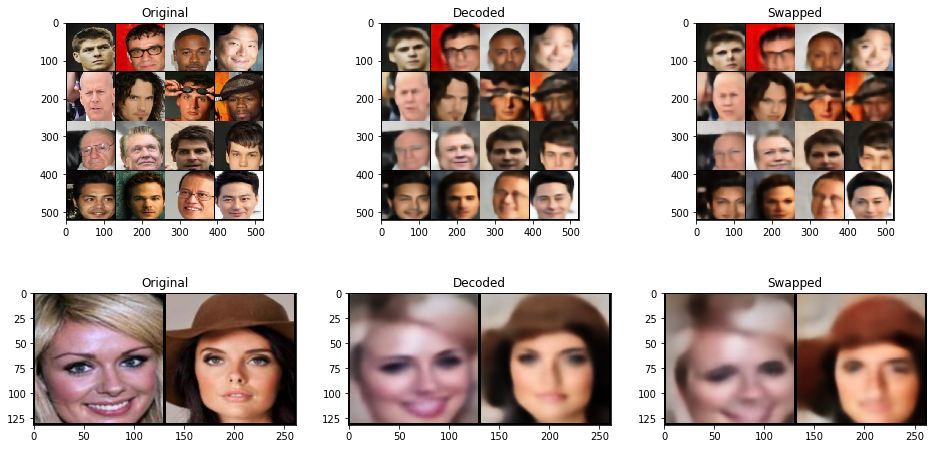

===> Saving models...
Copying file://./checkpoint/autoencoder128b.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

/
Operation completed over 1 objects/1.6 GiB.                                      


In [15]:
train(n_epochs=101, train_loader_A=train_loader_female, train_loader_B=train_loader_male, model_name="autoencoder128b.pt")

===> Load last checkpoint data, resuming from epoch 1000
Training...
epoch: 1000, lossA:0.03446457271153728, lossB:0.03607114776968956
===> Saving models...


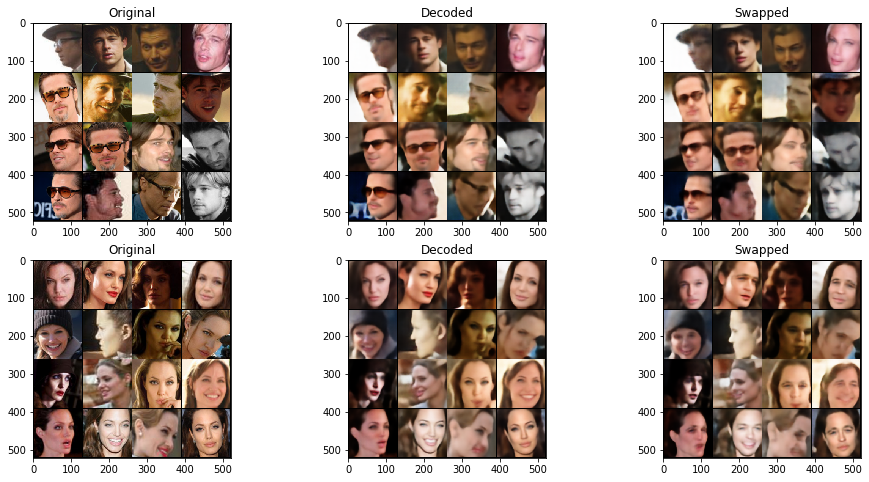

epoch: 1010, lossA:0.03355194705848893, lossB:0.034987201914191246
epoch: 1020, lossA:0.03355439441899458, lossB:0.03541179373860359
epoch: 1030, lossA:0.033816380271067224, lossB:0.035047454138596855
epoch: 1040, lossA:0.0333951593687137, lossB:0.03498354305823644
epoch: 1050, lossA:0.03387733114262422, lossB:0.035442495408157505
===> Saving models...


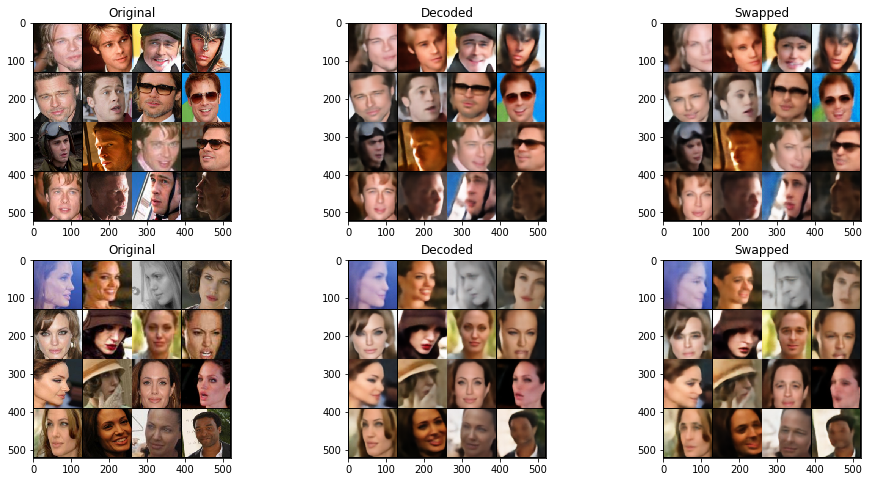

epoch: 1060, lossA:0.03395680400232474, lossB:0.03595455208172401
epoch: 1070, lossA:0.03367980352292458, lossB:0.036196810814241566
epoch: 1080, lossA:0.03333733122174939, lossB:0.034787798610826336
epoch: 1090, lossA:0.034014261327683926, lossB:0.03575359936803579
epoch: 1100, lossA:0.033520367462188005, lossB:0.03498658941437801
===> Saving models...


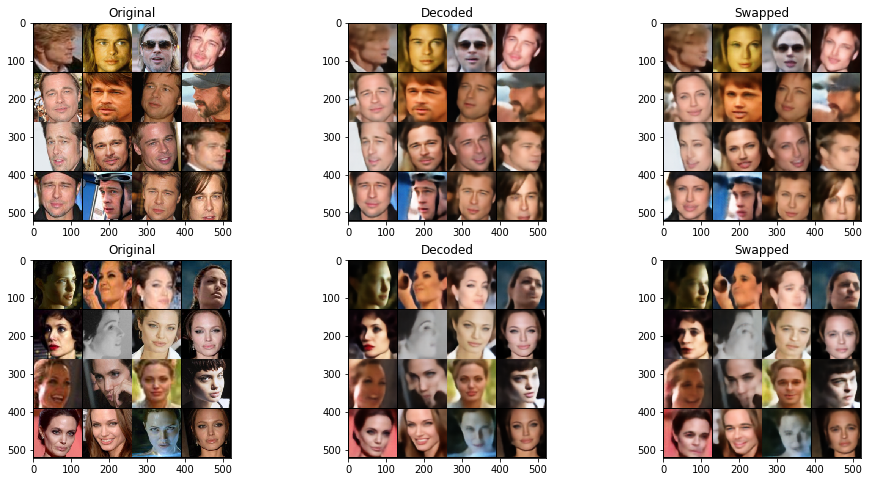

epoch: 1110, lossA:0.03342883102595806, lossB:0.03539435130854448
epoch: 1120, lossA:0.033493188209831715, lossB:0.03543380337456862
epoch: 1130, lossA:0.033704317174851894, lossB:0.036101264568666615
epoch: 1140, lossA:0.0334949754178524, lossB:0.035272748209536076
epoch: 1150, lossA:0.03334491125618418, lossB:0.03443451474110285
===> Saving models...


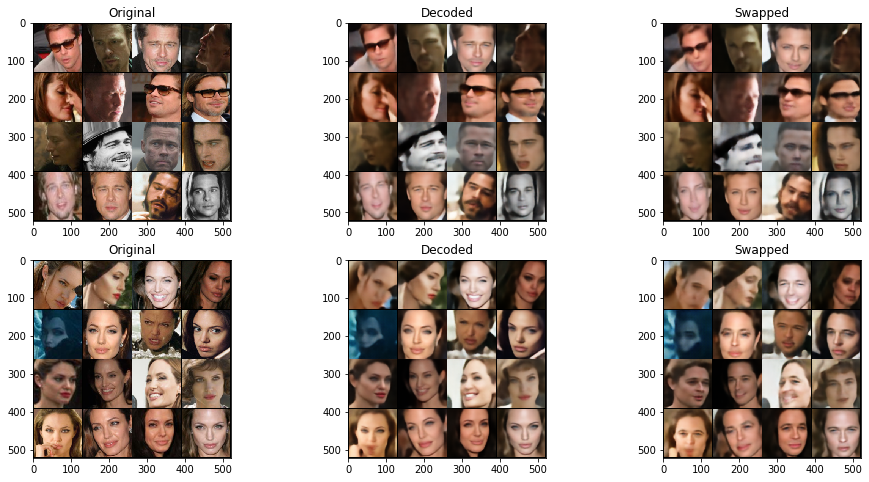

epoch: 1160, lossA:0.03365442591408888, lossB:0.03510922814408938
epoch: 1170, lossA:0.034020812871555485, lossB:0.03455387149006128
epoch: 1180, lossA:0.03336843972404798, lossB:0.034344147269924484
epoch: 1190, lossA:0.033153197883317866, lossB:0.035504610588153206
epoch: 1200, lossA:0.03315946971997619, lossB:0.03519429794202248
===> Saving models...


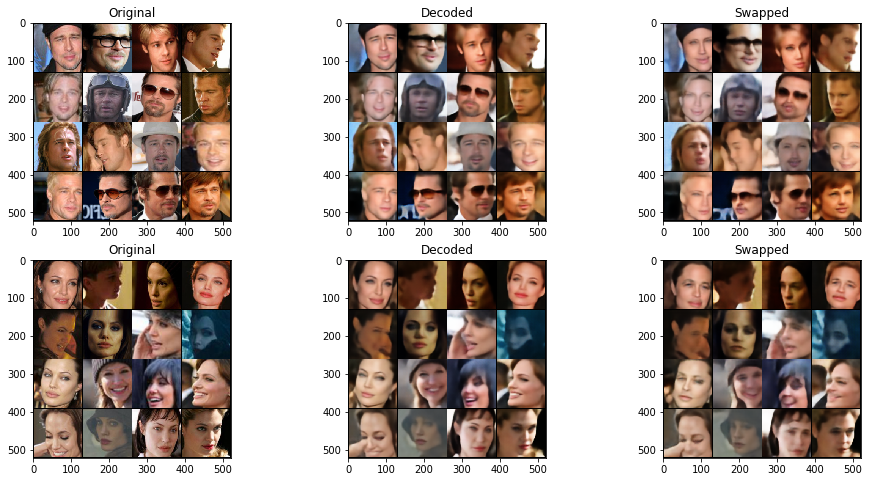

epoch: 1210, lossA:0.033292804999897875, lossB:0.03544728644192219
epoch: 1220, lossA:0.03350822146361073, lossB:0.03452173061668873
epoch: 1230, lossA:0.03340669690320889, lossB:0.0343833789229393
epoch: 1240, lossA:0.03262821134800712, lossB:0.03491617739200592
epoch: 1250, lossA:0.03303655826797088, lossB:0.03495813223222891
===> Saving models...


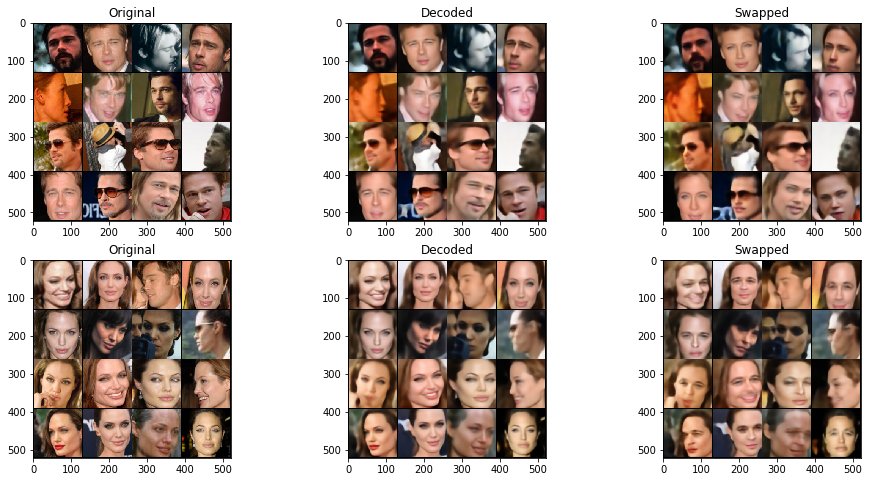

epoch: 1260, lossA:0.03282908614103993, lossB:0.0345360217615962
epoch: 1270, lossA:0.03281265947346886, lossB:0.0351135078817606
epoch: 1280, lossA:0.03304049279540777, lossB:0.03525042223433653
epoch: 1290, lossA:0.03295776123801867, lossB:0.034716698651512466
epoch: 1300, lossA:0.03297041542828083, lossB:0.034620629933973156
===> Saving models...


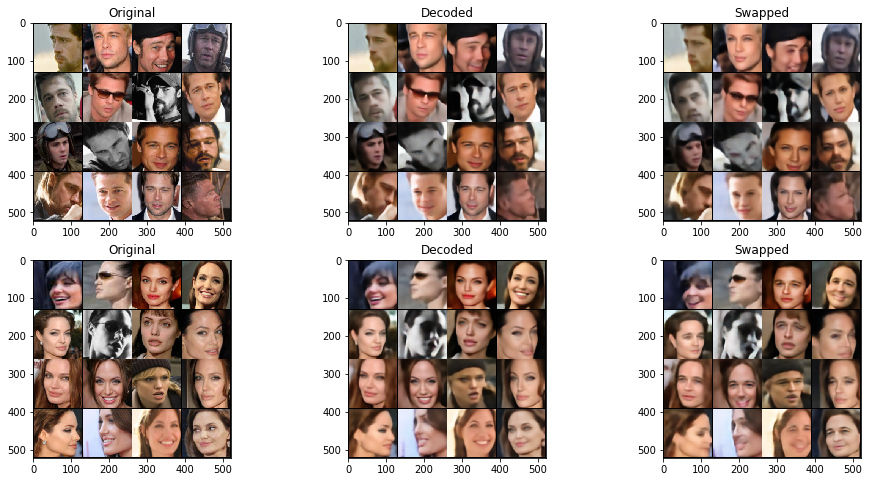

epoch: 1310, lossA:0.032985435953984656, lossB:0.033429323540379606
epoch: 1320, lossA:0.033213110795865454, lossB:0.034968942714234195
epoch: 1330, lossA:0.03261607295523087, lossB:0.0340578593313694
epoch: 1340, lossA:0.03289002040401101, lossB:0.034503319300711155
epoch: 1350, lossA:0.032814440317451954, lossB:0.03463272269194325
===> Saving models...


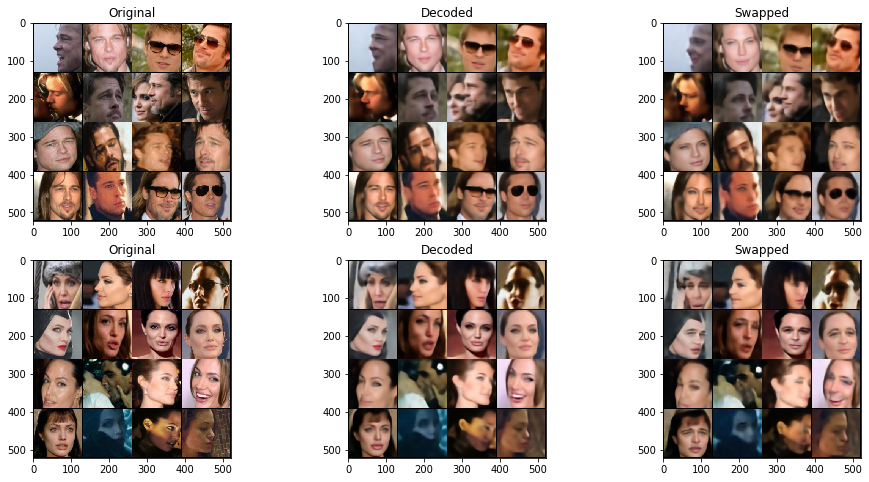

epoch: 1360, lossA:0.03294880377749602, lossB:0.033798595890402794
epoch: 1370, lossA:0.032690834098805986, lossB:0.03386642597615719
epoch: 1380, lossA:0.03246200131252408, lossB:0.03442390852918228
epoch: 1390, lossA:0.03303178772330284, lossB:0.034200319554656744
epoch: 1400, lossA:0.03256942083438238, lossB:0.03396527376025915
===> Saving models...


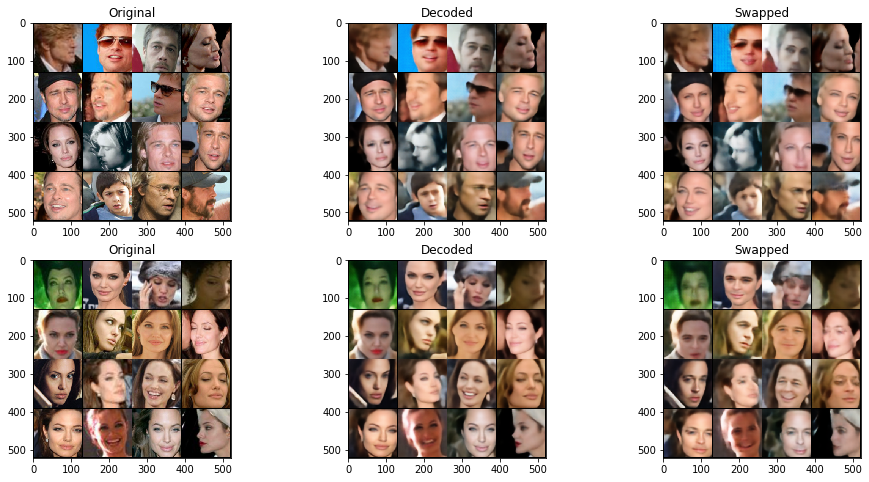

epoch: 1410, lossA:0.032533830497413874, lossB:0.034874679520726204
epoch: 1420, lossA:0.03253928463285168, lossB:0.03330673184245825
epoch: 1430, lossA:0.03243659297004342, lossB:0.03405087596426407
epoch: 1440, lossA:0.03241186169907451, lossB:0.034510630182921886
epoch: 1450, lossA:0.03250485472381115, lossB:0.03360640428339442
===> Saving models...


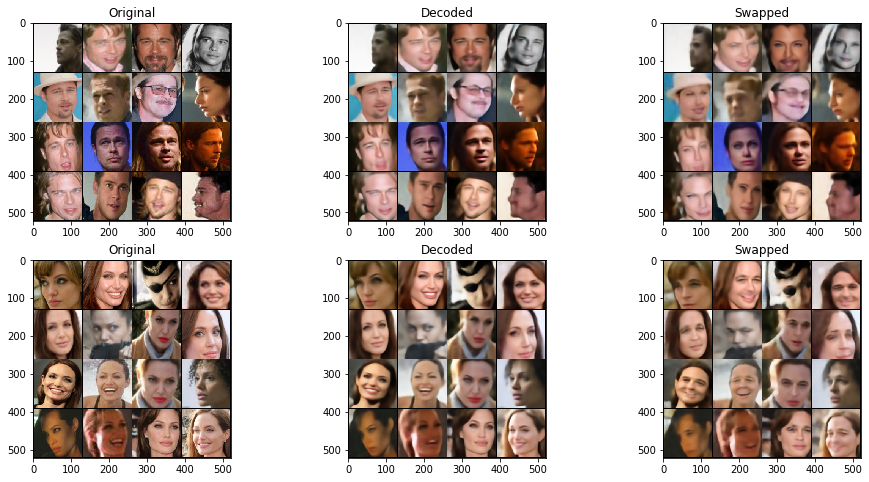

epoch: 1460, lossA:0.032226459278414644, lossB:0.034200613386929035
epoch: 1470, lossA:0.032795109475652374, lossB:0.0342368446290493
epoch: 1480, lossA:0.032993536442518234, lossB:0.03461538286258777
epoch: 1490, lossA:0.03222852355490128, lossB:0.033744426133732
epoch: 1500, lossA:0.032620723048845925, lossB:0.03326910020162662
===> Saving models...


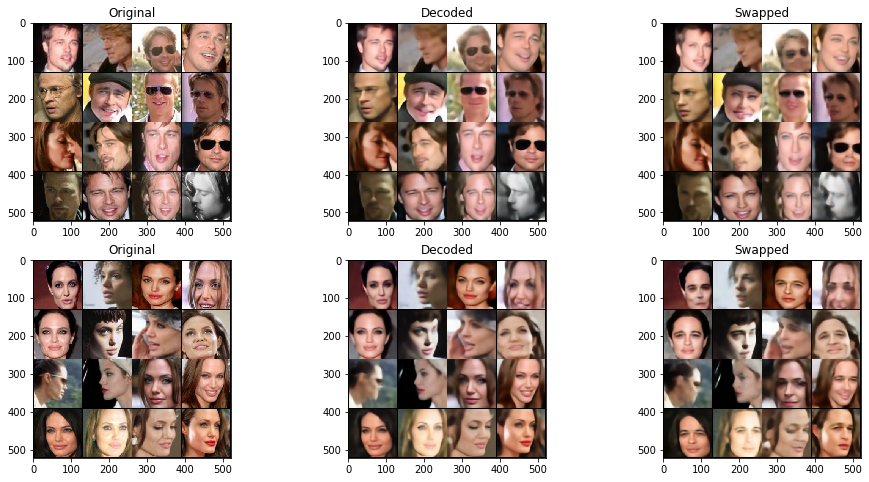

===> Saving models...
Copying file://./checkpoint/autoencoder128b.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/1.6 GiB.                                      


In [19]:
train(n_epochs=1501, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128b.pt")

===> Load last checkpoint data, resuming from epoch 300
Training...
epoch: 300, lossA:0.04176163642356793, lossB:0.043797311993936695
===> Saving models...


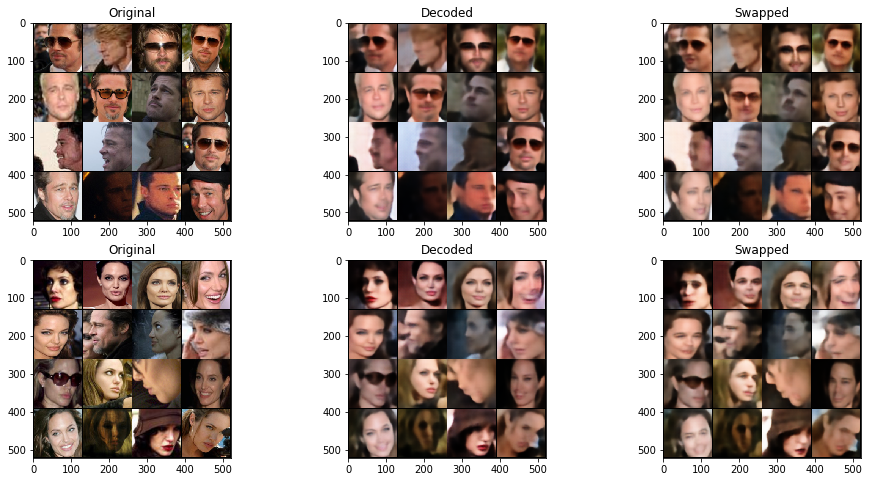

epoch: 310, lossA:0.04031476409484943, lossB:0.04306532877186934
epoch: 320, lossA:0.04134768154472113, lossB:0.04343511816114187
epoch: 330, lossA:0.04035848472267389, lossB:0.04254864466687044
epoch: 340, lossA:0.04062722778568665, lossB:0.04313409266372522
epoch: 350, lossA:0.04064534232020378, lossB:0.041869559325277805
===> Saving models...


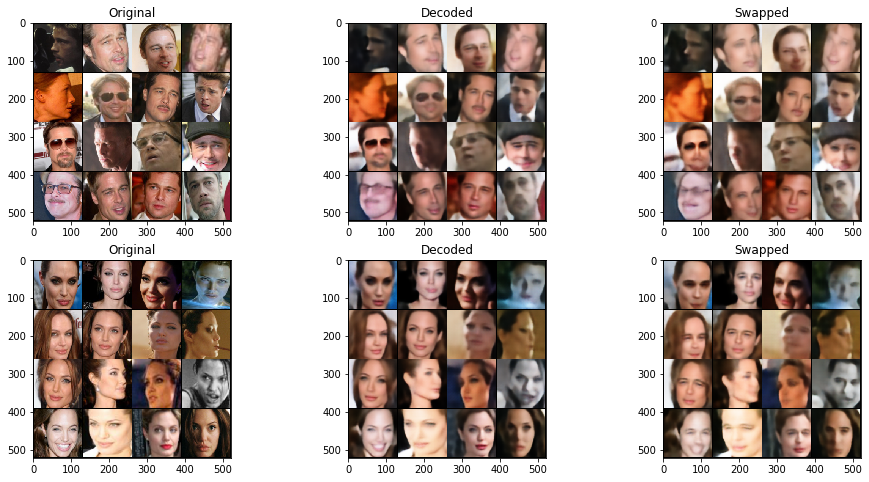

epoch: 360, lossA:0.040560842491686344, lossB:0.04354926633338133
epoch: 370, lossA:0.039890989661216736, lossB:0.042494469632705055
epoch: 380, lossA:0.039951138819257416, lossB:0.041793628906210266
epoch: 390, lossA:0.0408219521244367, lossB:0.04342175119866928
epoch: 400, lossA:0.04013467331727346, lossB:0.04143030010163784
===> Saving models...


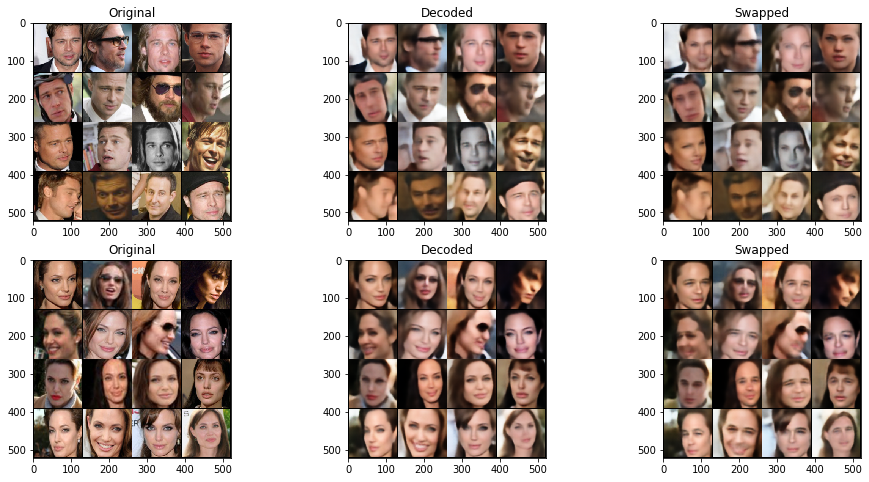

epoch: 410, lossA:0.03881628159433603, lossB:0.04168566626807054
epoch: 420, lossA:0.040014488312105335, lossB:0.042742074777682625
epoch: 430, lossA:0.03959045372903347, lossB:0.041836321664353214
epoch: 440, lossA:0.03969013877213001, lossB:0.041039070735375084
epoch: 450, lossA:0.03944810573011637, lossB:0.04034314087281624
===> Saving models...


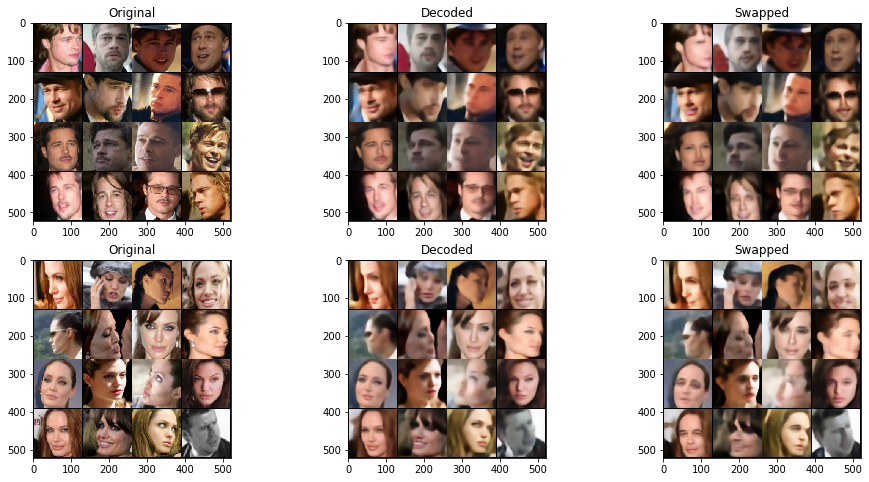

epoch: 460, lossA:0.03958608955144882, lossB:0.04086801130324602
epoch: 470, lossA:0.038989703791836895, lossB:0.04130523558706045
epoch: 480, lossA:0.03843674249947071, lossB:0.04058524966239929
epoch: 490, lossA:0.03887755951533715, lossB:0.04025818966329098
epoch: 500, lossA:0.040062904047469296, lossB:0.042177050995330014
===> Saving models...


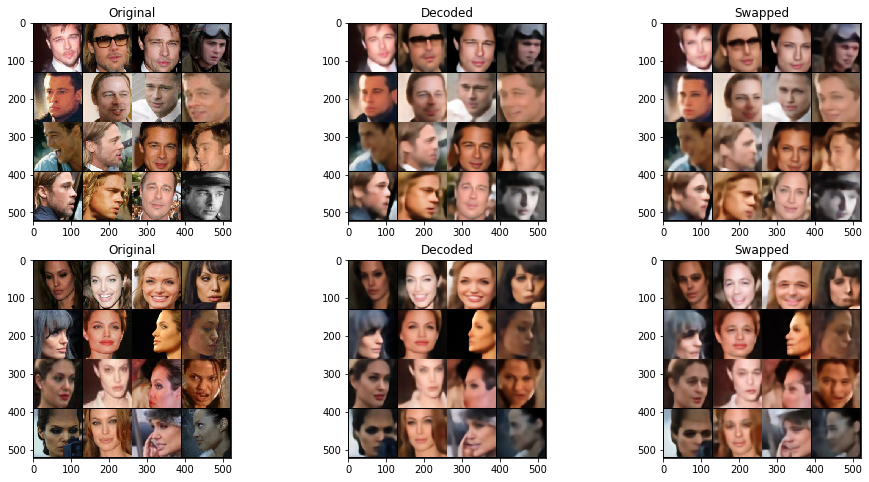

===> Saving models...
Copying file://./checkpoint/autoencoder128b.pt [Content-Type=application/octet-stream]...
==> NOTE: You are uploading one or more large file(s), which would run
significantly faster if you enable parallel composite uploads. This
feature can be enabled by editing the
"parallel_composite_upload_threshold" value in your .boto
configuration file. However, note that if you do this large files will
be uploaded as `composite objects
<https://cloud.google.com/storage/docs/composite-objects>`_,which
means that any user who downloads such objects will need to have a
compiled crcmod installed (see "gsutil help crcmod"). This is because
without a compiled crcmod, computing checksums on composite objects is
so slow that gsutil disables downloads of composite objects.

\
Operation completed over 1 objects/1.6 GiB.                                      


In [17]:
train(n_epochs=2501, train_loader_A=train_loader_A, train_loader_B=train_loader_B, model_name="autoencoder128b.pt")

In [0]:
for pg in optimizer_1.param_groups:
  # pg['lr'] = 1e-6
  print(pg['lr'])

for pg in optimizer_2.param_groups:
  # pg['lr'] = 1e-6
  print(pg['lr'])  

1e-06
1e-06
1e-06
1e-06


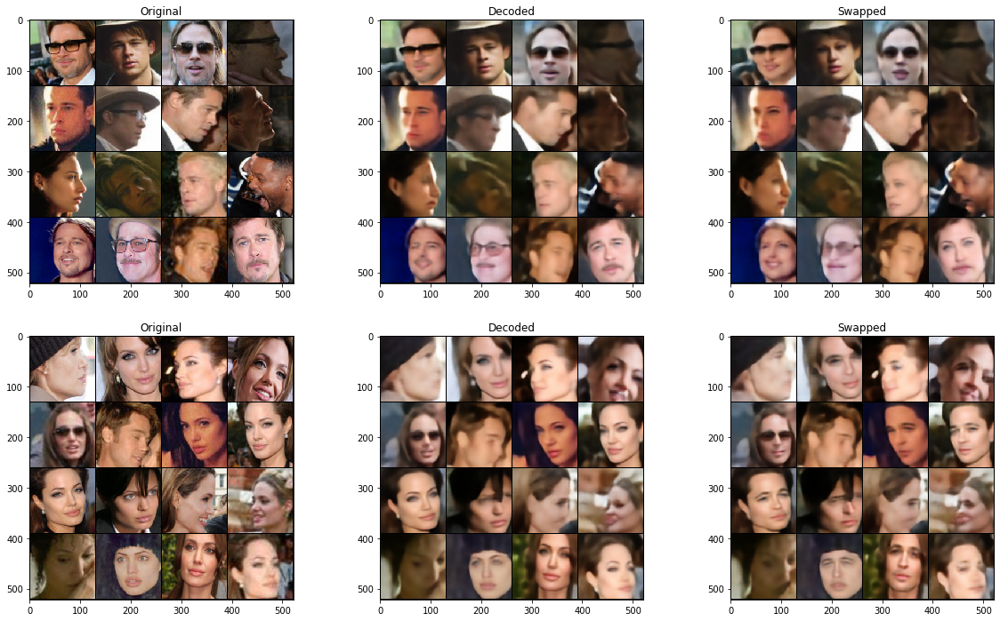

In [20]:
with torch.no_grad():
    warped_A, target_A = next(iter(train_loader_A))
    warped_B, target_B = next(iter(train_loader_B))

    target_A = target_A.cuda()
    target_B = target_B.cuda()

    warped_A = model(target_A, 'A')
    warped_B = model(target_B, 'B')
    swapped_A = model(target_A, 'B')
    swapped_B = model(target_B, 'A')

    fig, ax = plt.subplots(2, 3, figsize=(20,12))
    ax[0,0].imshow(np.transpose(vutils.make_grid(target_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,0].set_title("Original")
    ax[0,1].imshow(np.transpose(vutils.make_grid(warped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,1].set_title("Decoded")
    ax[0,2].imshow(np.transpose(vutils.make_grid(swapped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,2].set_title("Swapped")
    ax[1,0].imshow(np.transpose(vutils.make_grid(target_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,0].set_title("Original")
    ax[1,1].imshow(np.transpose(vutils.make_grid(warped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,1].set_title("Decoded")
    ax[1,2].imshow(np.transpose(vutils.make_grid(swapped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,2].set_title("Swapped")
    plt.show()

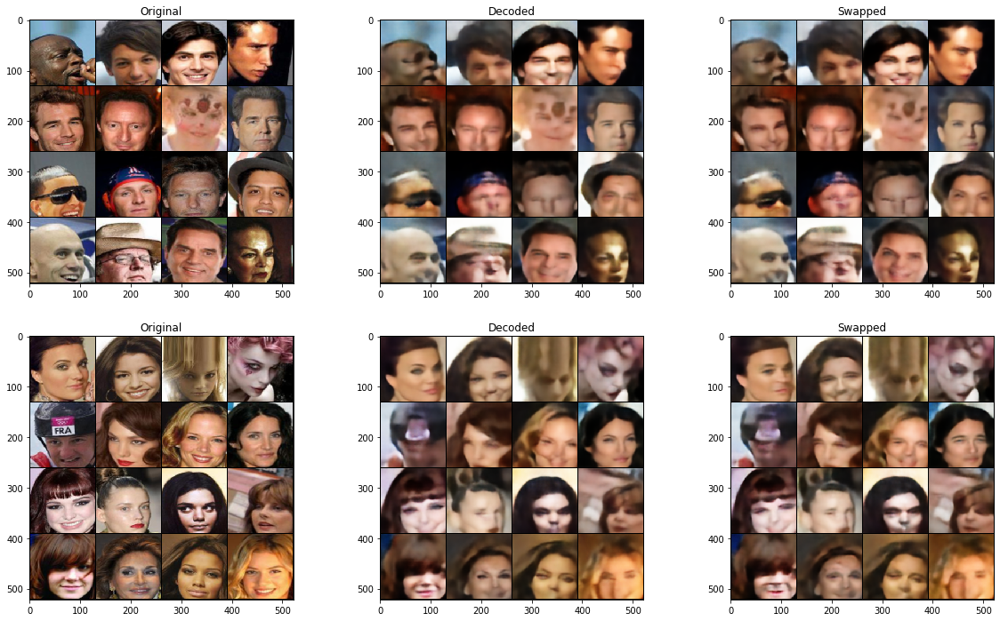

In [21]:
with torch.no_grad():
    warped_A, target_A = next(iter(train_loader_female))
    warped_B, target_B = next(iter(train_loader_male))

    target_A = target_A.cuda()
    target_B = target_B.cuda()

    warped_A = model(target_A, 'A')
    warped_B = model(target_B, 'B')
    swapped_A = model(target_A, 'B')
    swapped_B = model(target_B, 'A')

    fig, ax = plt.subplots(2, 3, figsize=(20,12))
    ax[0,0].imshow(np.transpose(vutils.make_grid(target_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,0].set_title("Original")
    ax[0,1].imshow(np.transpose(vutils.make_grid(warped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,1].set_title("Decoded")
    ax[0,2].imshow(np.transpose(vutils.make_grid(swapped_B.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[0,2].set_title("Swapped")
    ax[1,0].imshow(np.transpose(vutils.make_grid(target_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,0].set_title("Original")
    ax[1,1].imshow(np.transpose(vutils.make_grid(warped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,1].set_title("Decoded")
    ax[1,2].imshow(np.transpose(vutils.make_grid(swapped_A.detach().cpu()[:16], nrow=4, padding=2, normalize=True),(1,2,0)))
    ax[1,2].set_title("Swapped")
    plt.show()